In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

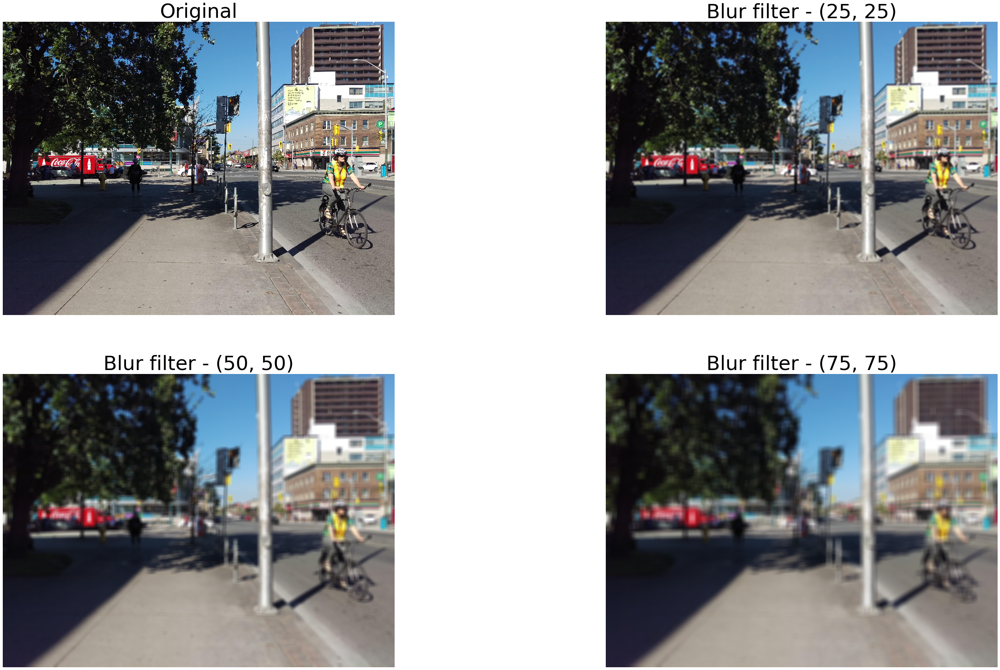

In [2]:
img = cv2.imread("Images/cc5dEAyQECBFF9MN3MbdZA.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
blur_filters = [(25, 25), (50, 50), (75, 75)]

fontdict = {'fontsize' : 50}

fig = plt.figure(figsize = (50, 30))
ax = fig.add_subplot(2, 2, 1)
ax.axis('off')
plt.imshow(img)
plt.title("Original", fontdict = fontdict)
img_blur = [None for i in range(len(blur_filters))]
for i in range(len(blur_filters)):
    img_blur[i] = cv2.blur(img, ksize = blur_filters[i])
    title = "Blur filter - " + str(blur_filters[i])
    ax = fig.add_subplot(2, 2, i+2)
    ax.axis('off')
    plt.imshow(img_blur[i])
    plt.title(title, fontdict = fontdict)

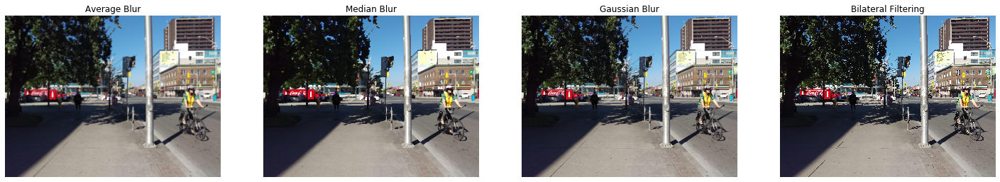

In [3]:
img = cv2.imread("Images/cc5dEAyQECBFF9MN3MbdZA.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

avg_blur = cv2.blur(img, ksize = (25, 25))
median_blur = cv2.medianBlur(img, ksize = 25)
gaussian_blur = cv2.GaussianBlur(img, ksize = (25, 25), sigmaX = 0)
bilateral_blur = cv2.bilateralFilter(img, 25, sigmaSpace = 75, sigmaColor = 75)
                                    
images = [avg_blur, median_blur, gaussian_blur, bilateral_blur]  
titles = ["Average Blur", "Median Blur", "Gaussian Blur", "Bilateral Filtering"]
fig = plt.figure(figsize = (25, 10))
for i in range(4):
    ax = fig.add_subplot(1, 4, i+1)
    plt.imshow(images[i])
    plt.title(titles[i])
    ax.axis('off')
    
plt.show()

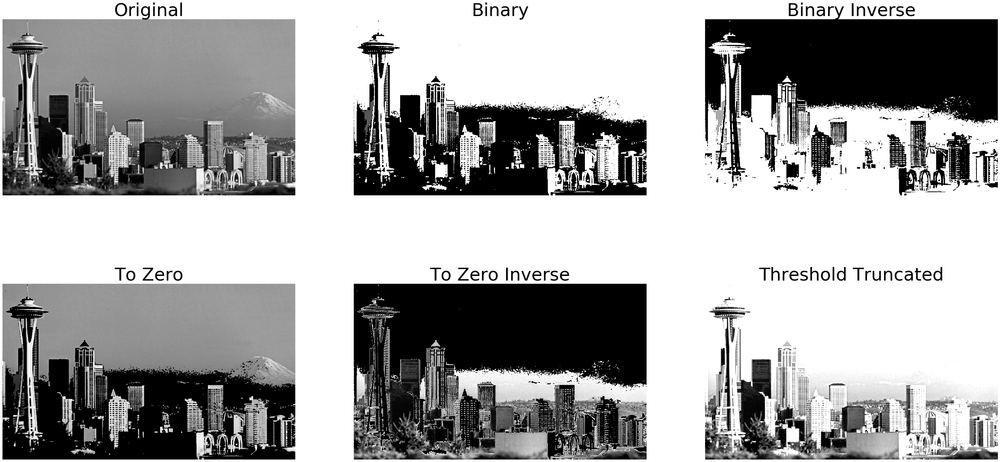

In [4]:
img = cv2.imread("Images/space_needle.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

_, thresh_1 = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
_, thresh_2 = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV)
_, thresh_3 = cv2.threshold(gray, 127, 255, cv2.THRESH_TOZERO)
_, thresh_4 = cv2.threshold(gray, 127, 255, cv2.THRESH_TOZERO_INV)
_, thresh_5 = cv2.threshold(gray, 127, 255, cv2.THRESH_TRUNC)
images = [gray, thresh_1, thresh_2, thresh_3, thresh_4, thresh_5]
titles = ["Original", "Binary", "Binary Inverse", "To Zero", "To Zero Inverse", "Threshold Truncated"]
fig = plt.figure(figsize = (50, 25))
for i in range(6):
    ax = fig.add_subplot(2, 3, i+1)
    plt.imshow(images[i], 'gray')
    plt.title(titles[i], fontdict = fontdict)
    ax.axis('off')
plt.show()

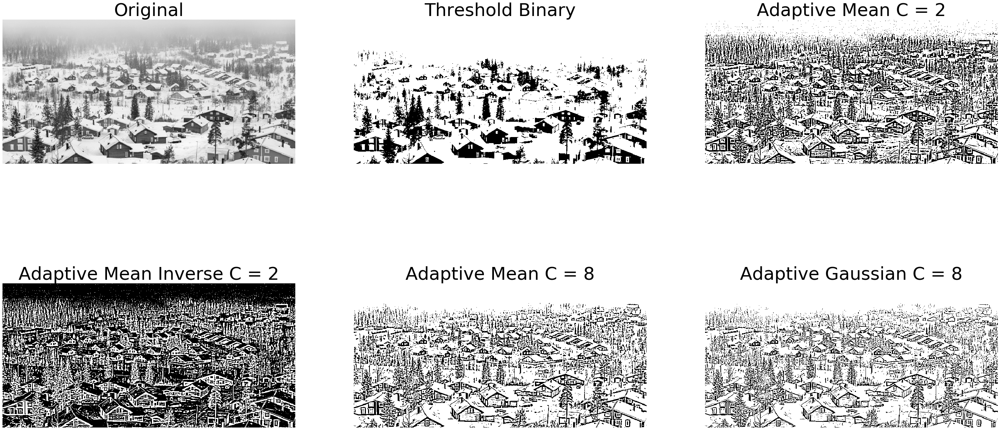

In [5]:
img = cv2.imread("Images/village-in-the-valley.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

_, thresh_binary = cv2.threshold(img, thresh = 127, maxval = 255, type = cv2.THRESH_BINARY)
adap_mean_2 = cv2.adaptiveThreshold(img, 255, 
                                    cv2.ADAPTIVE_THRESH_MEAN_C, 
                                    cv2.THRESH_BINARY, 7, 2)
adap_mean_2_inv = cv2.adaptiveThreshold(img, 255, 
                                        cv2.ADAPTIVE_THRESH_MEAN_C, 
                                        cv2.THRESH_BINARY_INV, 7, 2)
adap_mean_8 = cv2.adaptiveThreshold(img, 255, 
                                    cv2.ADAPTIVE_THRESH_MEAN_C, 
                                    cv2.THRESH_BINARY, 7, 8)
adap_gaussian_8 = cv2.adaptiveThreshold(img, 255, 
                                    cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                    cv2.THRESH_BINARY, 7, 8)
images = [img, thresh_binary, adap_mean_2, adap_mean_2_inv, adap_mean_8, adap_gaussian_8]
titles = ["Original", "Threshold Binary", "Adaptive Mean C = 2", "Adaptive Mean Inverse C = 2", "Adaptive Mean C = 8",
             "Adaptive Gaussian C = 8"]
fig = plt.figure(figsize = (50, 25))
for i in range(6):
    ax = fig.add_subplot(2, 3, i+1)
    plt.imshow(images[i], 'gray')
    plt.title(titles[i], fontdict = fontdict)
    ax.axis('off')
plt.show()

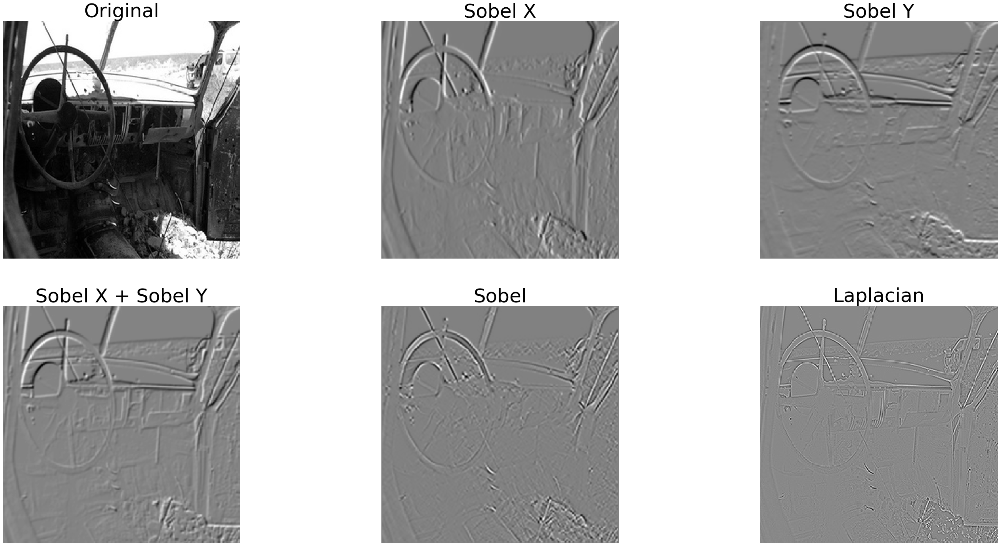

In [6]:
img_ = cv2.imread("Images/2011-01-05 07_51_54.jpg")
img = cv2.cvtColor(img_, cv2.COLOR_BGR2GRAY)

sobel_x = cv2.Sobel(img, cv2.CV_64F, dx = 1, dy = 0, ksize = 5)
sobel_y = cv2.Sobel(img, cv2.CV_64F, dx = 0, dy = 1, ksize = 5)
sobel = cv2.Sobel(img, cv2.CV_64F, dx = 1, dy = 1, ksize = 5)
dilated = cv2.addWeighted(src1 = sobel_x, alpha = 0.5, src2 = sobel_y, beta = 0.5, gamma = 0)
laplacian = cv2.Laplacian(img, cv2.CV_64F)
images = [img, sobel_x, sobel_y, dilated, sobel, laplacian]
titles = ["Original", "Sobel X", "Sobel Y", "Sobel X + Sobel Y", "Sobel", "Laplacian"]


fig = plt.figure(figsize = (50, 25))
for i in range(6):
    ax = fig.add_subplot(2, 3, i+1)
    plt.imshow(images[i], 'gray')
    plt.title(titles[i], fontdict = fontdict)
    ax.axis('off')
plt.show()

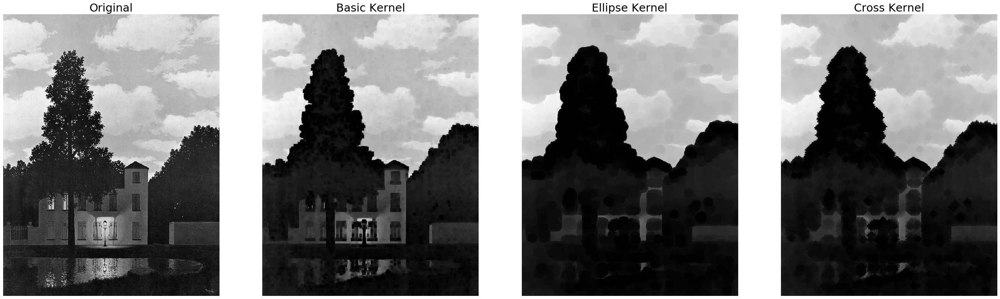

In [7]:
img = cv2.imread("Images/magritte.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

kernel_0 = np.ones((3, 3), np.uint8)
kernel_1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (9, 9))
kernel_2 = cv2.getStructuringElement(cv2.MORPH_CROSS, (9, 9))
kernels = [kernel_0, kernel_1, kernel_2]
images = [img]
for i in range(3):
    img_kernel = cv2.erode(img, kernels[i], iterations = 3)
    images.append(img_kernel)


titles = ["Original", "Basic Kernel", "Ellipse Kernel", "Cross Kernel"]
fig = plt.figure(figsize = (40, 15))
for i in range(4):
    ax = fig.add_subplot(1, 4, i+1)
    plt.imshow(images[i], 'gray')
    plt.title(titles[i], fontdict = {'fontsize':25})
    ax.axis('off')
plt.show()

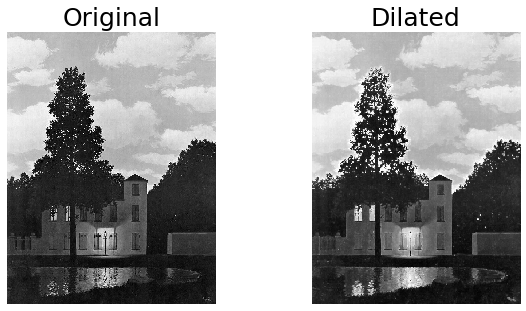

In [8]:
img = cv2.imread("Images/magritte.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

kernel = np.ones((3, 3), np.uint8)
dilated = cv2.dilate(img, kernel, iterations = 1)

images = [img, dilated]
titles = ["Original", "Dilated"]

fig = plt.figure(figsize = (10, 5))
for i in range(2):
    ax = fig.add_subplot(1, 2, i+1)
    plt.imshow(images[i], 'gray')
    plt.title(titles[i], fontdict = {'fontsize':25})
    ax.axis('off')
plt.show()

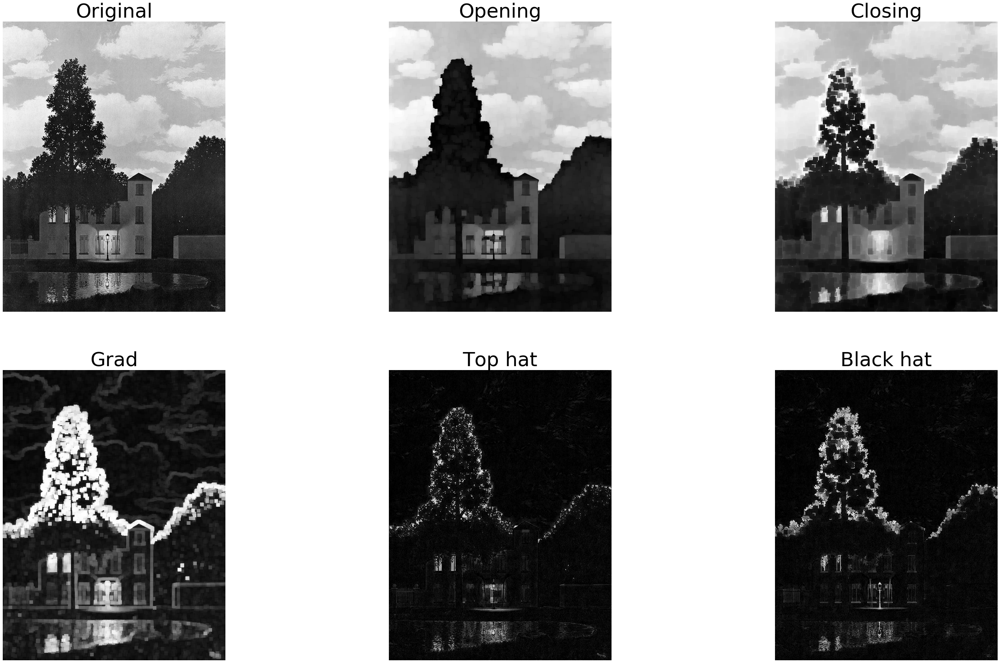

In [9]:
img = cv2.imread("Images/magritte.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

kernel = np.ones((9, 9), np.uint8)

img_open = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
img_close = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
img_grad = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)
img_tophat = cv2.morphologyEx(img, cv2.MORPH_TOPHAT, kernel)
img_blackhat = cv2.morphologyEx(img, cv2.MORPH_BLACKHAT, kernel)

images = [img, img_open, img_close, img_grad, img_tophat, img_blackhat]
titles = ["Original", "Opening", "Closing", "Grad", "Top hat", "Black hat"]

fig = plt.figure(figsize = (50, 30))
for i in range(6):
    ax = fig.add_subplot(2, 3, i+1)
    plt.imshow(images[i], 'gray')
    plt.title(titles[i], fontdict = fontdict)
    ax.axis('off')
plt.show()